In [1]:
!conda info


     active environment : base
    active env location : /opt/anaconda3/envs/py39
            shell level : 2
       user config file : /Users/marcelo_palermo/.condarc
 populated config files : /Users/marcelo_palermo/.condarc
          conda version : 4.13.0
    conda-build version : not installed
         python version : 3.9.13.final.0
       virtual packages : __osx=12.4=0
                          __unix=0=0
                          __archspec=1=x86_64
       base environment : /opt/anaconda3/envs/py39  (writable)
      conda av data dir : /opt/anaconda3/envs/py39/etc/conda
  conda av metadata url : None
           channel URLs : https://conda.anaconda.org/conda-forge/osx-64
                          https://conda.anaconda.org/conda-forge/noarch
                          https://repo.anaconda.com/pkgs/main/osx-64
                          https://repo.anaconda.com/pkgs/main/noarch
                          https://repo.anaconda.com/pkgs/r/osx-64
                          https://

In [2]:
#import sys
#!{sys.executable} -m pip install sklearn
#!{sys.executable} -m pip install scikit-learn
#!{sys.executable} -m pip install matplotlib
#!{sys.executable} -m pip install seaborn
#!{sys.executable} -m pip install pandas

In [3]:
from sklearn import preprocessing
from sklearn import inspection
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.inspection import DecisionBoundaryDisplay

In [4]:
data = pd.read_csv("anova_ML_Training_class.csv")
data = data[(data["class"] == '50 above') | (data["class"] == '49 below')]

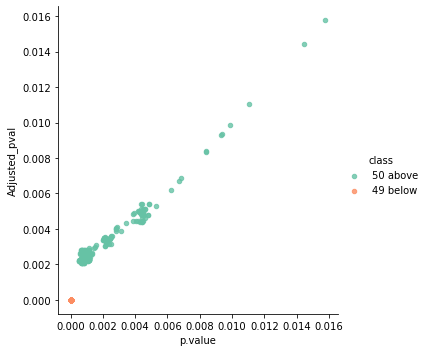

<Figure size 10000x800 with 0 Axes>

In [5]:
sns.lmplot(x='p.value',y='Adjusted_pval', data=data,hue='class', palette='Set2',fit_reg=False, scatter_kws={"s": 20})
plt.figure(figsize=(100,8), dpi= 100, facecolor='w', edgecolor='k')
plt.show()

In [6]:
data.head()

,Unnamed: 0,Assay,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Adjusted_pval,Threshold,class,type
0,1,CCL8,OID05130,P80075,Olink COVID,Time,1,7.255296,7.255296,7.540996,0.015766,0.015766,Significant,50 above,Simulated
1,2,CCL8,OID05130,P80075,Olink COVID,Time,1,7.464403,7.464403,7.789055,0.014437,0.014437,Significant,50 above,Simulated
2,3,CCL8,OID05130,P80075,Olink COVID,Time,1,7.878141,7.878141,8.558400,0.011070,0.011070,Significant,50 above,Simulated
3,4,CCL8,OID05130,P80075,Olink COVID,Time,1,7.936174,7.936174,9.083152,0.009293,0.009293,Significant,50 above,Simulated
4,5,CCL8,OID05130,P80075,Olink COVID,Time,1,8.173045,8.173045,8.902024,0.009867,0.009867,Significant,50 above,Simulated


In [7]:
data.shape

(360, 15)

In [8]:
data

,Unnamed: 0,Assay,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Adjusted_pval,Threshold,class,type
0,1,CCL8,OID05130,P80075,Olink COVID,Time,1,7.255296,7.255296,7.540996,1.576562e-02,1.576562e-02,Significant,50 above,Simulated
1,2,CCL8,OID05130,P80075,Olink COVID,Time,1,7.464403,7.464403,7.789055,1.443688e-02,1.443688e-02,Significant,50 above,Simulated
2,3,CCL8,OID05130,P80075,Olink COVID,Time,1,7.878141,7.878141,8.558400,1.107026e-02,1.107026e-02,Significant,50 above,Simulated
3,4,CCL8,OID05130,P80075,Olink COVID,Time,1,7.936174,7.936174,9.083152,9.293257e-03,9.293257e-03,Significant,50 above,Simulated
4,5,CCL8,OID05130,P80075,Olink COVID,Time,1,8.173045,8.173045,8.902024,9.866520e-03,9.866520e-03,Significant,50 above,Simulated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,1076,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,41.429344,41.429344,157.872084,8.300419e-21,4.150210e-20,Significant,49 below,Simulated
1076,1077,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.061999,42.061999,159.604568,6.168482e-21,3.084241e-20,Significant,49 below,Simulated
1077,1078,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.589315,42.589315,159.881472,5.883817e-21,2.941909e-20,Significant,49 below,Simulated
1078,1079,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.929634,42.929634,157.738593,8.493224e-21,4.246612e-20,Significant,49 below,Simulated


In [9]:
data.shape

(360, 15)

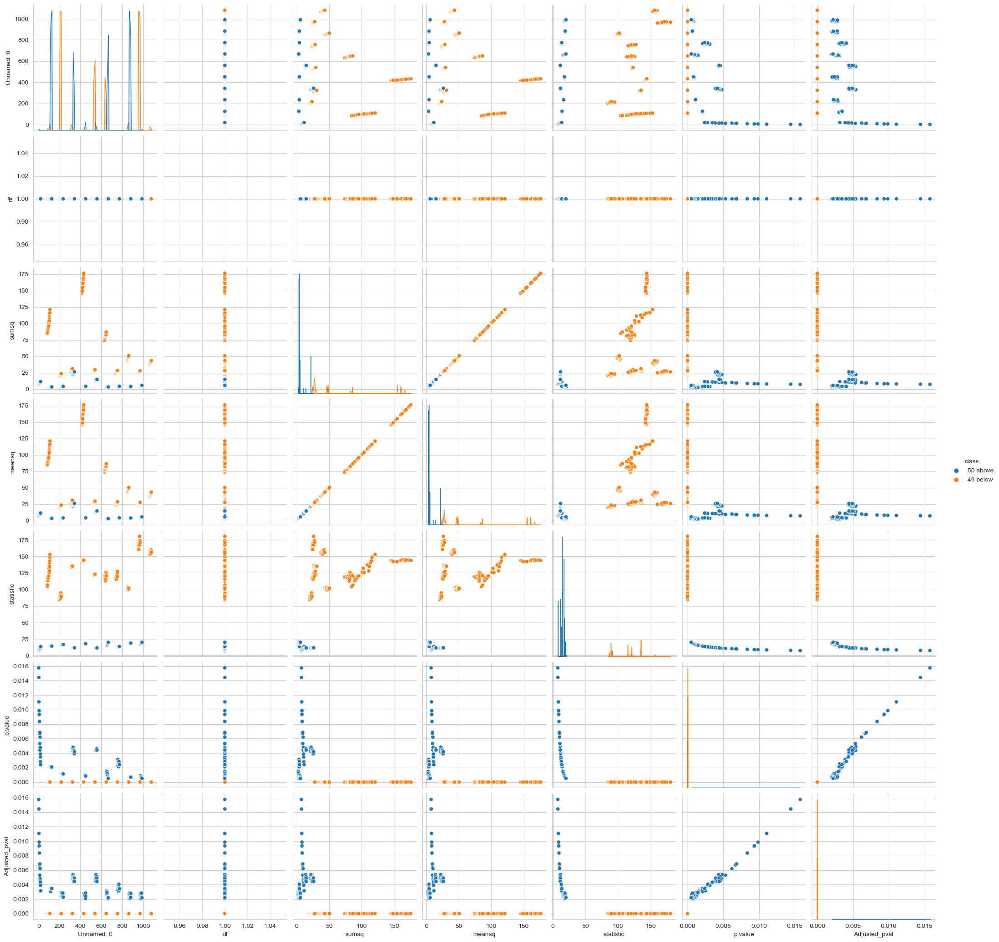

In [10]:
plt.close();
sns.set_style("whitegrid");
sns.pairplot(data, hue="class", height=3, diag_kws={'bw_adjust': 0.001});
plt.show()

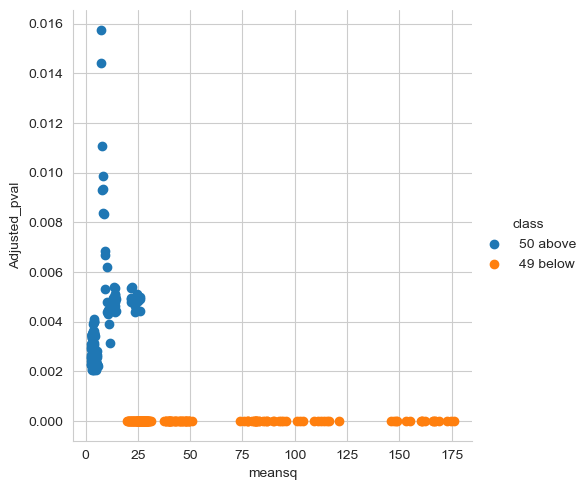

In [11]:
sns.set_style("whitegrid");
sns.FacetGrid(data, hue='class', height=5) \
.map(plt.scatter, "meansq", "Adjusted_pval") \
.add_legend();
plt.show()

In [12]:
data.insert(2, "Protein_name", data.Assay.values)
data.insert(12,"Class_name", data['class'].values)

#data.insert(14,"class names", data.Classif.values)

In [13]:
data

,Unnamed: 0,Assay,Protein_name,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Class_name,Adjusted_pval,Threshold,class,type
0,1,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,7.255296,7.255296,7.540996,1.576562e-02,50 above,1.576562e-02,Significant,50 above,Simulated
1,2,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,7.464403,7.464403,7.789055,1.443688e-02,50 above,1.443688e-02,Significant,50 above,Simulated
2,3,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,7.878141,7.878141,8.558400,1.107026e-02,50 above,1.107026e-02,Significant,50 above,Simulated
3,4,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,7.936174,7.936174,9.083152,9.293257e-03,50 above,9.293257e-03,Significant,50 above,Simulated
4,5,CCL8,CCL8,OID05130,P80075,Olink COVID,Time,1,8.173045,8.173045,8.902024,9.866520e-03,50 above,9.866520e-03,Significant,50 above,Simulated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,1076,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,41.429344,41.429344,157.872084,8.300419e-21,49 below,4.150210e-20,Significant,49 below,Simulated
1076,1077,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.061999,42.061999,159.604568,6.168482e-21,49 below,3.084241e-20,Significant,49 below,Simulated
1077,1078,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.589315,42.589315,159.881472,5.883817e-21,49 below,2.941909e-20,Significant,49 below,Simulated
1078,1079,SIGLEC1,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.929634,42.929634,157.738593,8.493224e-21,49 below,4.246612e-20,Significant,49 below,Simulated


In [14]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(data.Assay.unique())

le.transform(data.Assay.unique())
data['Assay'] = le.fit_transform(data.Assay.values)

le.fit(data.Class_name.unique())
data['Class_name'] = le.fit_transform(data.Class_name.values)
data

,Unnamed: 0,Assay,Protein_name,OlinkID,UniProt,Panel,term,df,sumsq,meansq,statistic,p.value,Class_name,Adjusted_pval,Threshold,class,type
0,1,0,CCL8,OID05130,P80075,Olink COVID,Time,1,7.255296,7.255296,7.540996,1.576562e-02,1,1.576562e-02,Significant,50 above,Simulated
1,2,0,CCL8,OID05130,P80075,Olink COVID,Time,1,7.464403,7.464403,7.789055,1.443688e-02,1,1.443688e-02,Significant,50 above,Simulated
2,3,0,CCL8,OID05130,P80075,Olink COVID,Time,1,7.878141,7.878141,8.558400,1.107026e-02,1,1.107026e-02,Significant,50 above,Simulated
3,4,0,CCL8,OID05130,P80075,Olink COVID,Time,1,7.936174,7.936174,9.083152,9.293257e-03,1,9.293257e-03,Significant,50 above,Simulated
4,5,0,CCL8,OID05130,P80075,Olink COVID,Time,1,8.173045,8.173045,8.902024,9.866520e-03,1,9.866520e-03,Significant,50 above,Simulated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,1076,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,41.429344,41.429344,157.872084,8.300419e-21,0,4.150210e-20,Significant,49 below,Simulated
1076,1077,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.061999,42.061999,159.604568,6.168482e-21,0,3.084241e-20,Significant,49 below,Simulated
1077,1078,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.589315,42.589315,159.881472,5.883817e-21,0,2.941909e-20,Significant,49 below,Simulated
1078,1079,9,SIGLEC1,OID06168,Q9BZZ2,Olink COVID,Time,1,42.929634,42.929634,157.738593,8.493224e-21,0,4.246612e-20,Significant,49 below,Simulated


In [15]:
from sklearn.model_selection import cross_val_score
#---holds the cv (cross-validates) scores---
cv_scores = []
#---use all features---
x = data[['Assay', 'Adjusted_pval']].values
y = data['class'].values

from sklearn.preprocessing import StandardScaler, RobustScaler
scaler = RobustScaler()
scaler.fit(x)

x = scaler.transform(x)

#---number of folds---
folds = 10
#---creating odd list of K for KNN---
ks = list(range(1,int(len(x) * ((folds - 1)/folds))))
#---remove all multiples of 3---
ks = [k for k in ks] # if k % 3 != 0]
#---perform k-fold cross validation---
for k in ks:
    knn = KNeighborsClassifier(n_neighbors=k)
    #---performs cross-validation and returns the average accuracy---
    scores = cross_val_score(knn, x, y, cv=folds, scoring='accuracy')
    mean = scores.mean()
    cv_scores.append(mean)
    print(k, mean)
    

1 1.0
2 1.0
3 1.0
4 1.0
5 1.0
6 1.0
7 1.0
8 1.0
9 1.0
10 1.0
11 1.0
12 1.0
13 1.0
14 1.0
15 1.0
16 1.0
17 1.0
18 1.0
19 1.0
20 1.0
21 1.0
22 1.0
23 1.0
24 1.0
25 1.0
26 1.0
27 1.0
28 1.0
29 1.0
30 1.0
31 1.0
32 1.0
33 1.0
34 1.0
35 1.0
36 1.0
37 1.0
38 1.0
39 1.0
40 1.0
41 1.0
42 1.0
43 1.0
44 1.0
45 1.0
46 1.0
47 1.0
48 1.0
49 1.0
50 1.0
51 1.0
52 1.0
53 1.0
54 1.0
55 1.0
56 1.0
57 1.0
58 1.0
59 1.0
60 1.0
61 1.0
62 1.0
63 1.0
64 1.0
65 1.0
66 1.0
67 1.0
68 1.0
69 1.0
70 1.0
71 1.0
72 1.0
73 1.0
74 1.0
75 1.0
76 1.0
77 1.0
78 1.0
79 1.0
80 1.0
81 1.0
82 1.0
83 1.0
84 1.0
85 1.0
86 1.0
87 1.0
88 1.0
89 1.0
90 1.0
91 1.0
92 1.0
93 1.0
94 1.0
95 1.0
96 1.0
97 1.0
98 1.0
99 1.0
100 1.0
101 1.0
102 1.0
103 1.0
104 1.0
105 1.0
106 1.0
107 1.0
108 0.961111111111111
109 1.0
110 1.0
111 1.0
112 1.0
113 1.0
114 1.0
115 1.0
116 0.9972222222222221
117 0.9972222222222221
118 0.9944444444444445
119 0.9944444444444445
120 0.9944444444444445
121 0.9944444444444445
122 0.9944444444444445
123 0.9944444

The optimal number of neighbors is 1


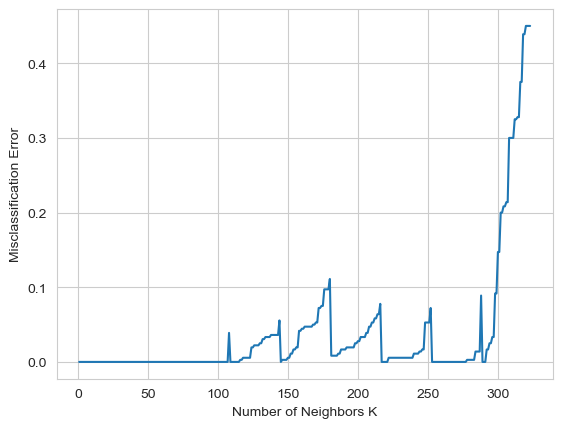

In [16]:
#---calculate misclassification error for each k---
MSE = [1 - x for x in cv_scores]

#---determining best k (min. MSE)---
optimal_k = ks[MSE.index(min(MSE))]
print(f"The optimal number of neighbors is {optimal_k}")

#---plot misclassification error vs k---
plt.plot(ks, MSE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

### Computing Accuracy, Recall, Precision, and Other Metrics

Based on the confusion matrix, you can calculate the following metrics:
- <b>Accuracy</b>: This is defined as the sum of all correct predictions divided by the total number of predictions, or mathematically: (TP/TN) / (TP + TN + FP + FN)
- This metric is easy to understand. After all, if the model correctly predicts 99 out of 100 samples, the accuracy is 0.99, which would be very impressivein the real world. But consider the following situation: Imagine that you’re trying to predict the failure of equipment based on the sample data. Out of 1,000 samples, only three are defective. If you use a dumb algorithm that always returns negative (meaning no failure) for all results, then the accuracy is 997/1000, which is 0.997. This is very impressive, but does this mean it’s a good algorithm? No. If there are 500 defective items in the dataset of 1,000 items, then the accuracy metric immediately indicates the flaw of the algorithm. In short, accuracy works best with evenly distributed data points, but it works really badly for a skewed dataset.
- <b>Precision</b>: This metric is defined to be TP / (TP + FP). This metric is concerned with number of correct positive predictions. You can think of precision as “of those predicted to be positive, how many were actually predicted correctly?”
- <b>Recall (also known as True Positive Rate (TPR))</b>: This metric is defined to be TP / (TP + FN). This metric is concerned with the number of correctly predicted positive events. You can think of recall as “of those positive events, how many were predicted correctly?” 
- <b>F1 Score</b>: This metric is defined to be 2 * (precision * recall) / (precision + recall). This is known as the harmonic mean of precision and recall, and it is a good way to summarize the evaluation of the algorithm in a single number.
- <b>False Positive Rate (FPR)</b>: This metric is defined to be FP / (FP+TN). FPR corresponds to the proportion of negative data points that are mistakenly considered as positive, with respect to all negative data points. In other words, the higher FPR, the more negative data points you’ll misclassify.


In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y , test_size=0.2, random_state=2)
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score, log_loss

from sklearn.preprocessing import StandardScaler, RobustScaler
scaler = RobustScaler()
scaler.fit(x_train)

x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)


knn=KNeighborsClassifier(optimal_k)
knn.fit(x_train, y_train)
ypred=knn.predict(x_test) #These are the predicted output values
result = confusion_matrix(y_test, ypred)
print("Confusion Matrix:")
print(result)
result1 = classification_report(y_test, ypred)
print("Classification Report:")
print(result1)
result2 = accuracy_score(y_test,ypred)
print("Accuracy:",result2)




Confusion Matrix:
[[35  0]
 [ 0 37]]
Classification Report:
              precision    recall  f1-score   support

    49 below       1.00      1.00      1.00        35
    50 above       1.00      1.00      1.00        37

    accuracy                           1.00        72
   macro avg       1.00      1.00      1.00        72
weighted avg       1.00      1.00      1.00        72

Accuracy: 1.0


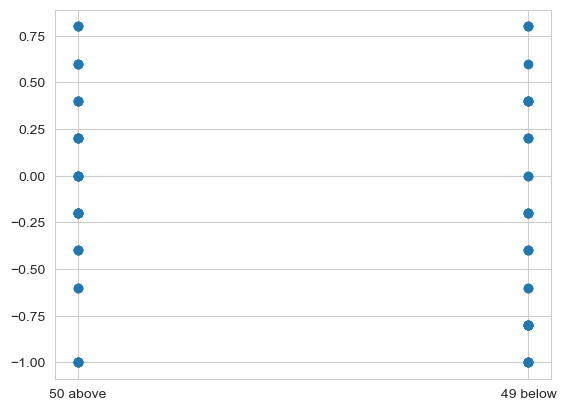

In [18]:
plt.scatter(ypred,x_test[:,0])
plt.show()

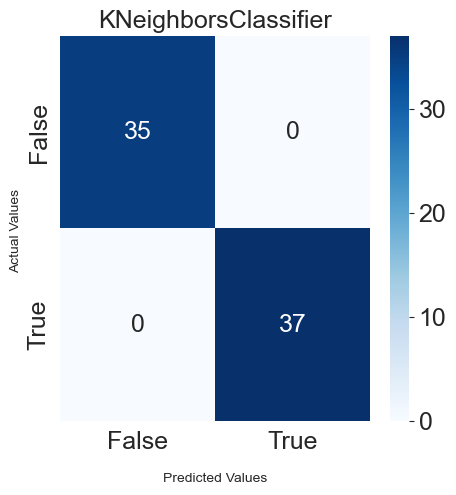

In [19]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(knn.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()


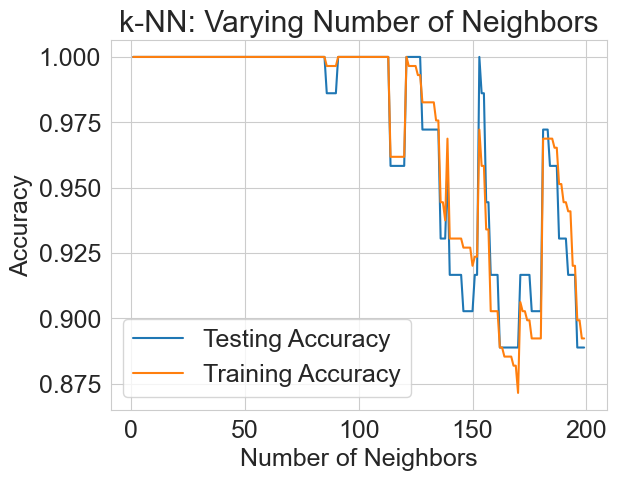

In [20]:
no_neighbors = np.arange(1, 200)
train_accuracy = np.empty(len(no_neighbors))
test_accuracy = np.empty(len(no_neighbors))

for i, k in enumerate(no_neighbors):
    # We instantiate the classifier
    knn = KNeighborsClassifier(n_neighbors=k)
    # Fit the classifier to the training data
    knn.fit(x_train,y_train)
    # Compute accuracy on the training set
    train_accuracy[i] = knn.score(x_train, y_train)
    #print(train_accuracy[i])
    # Compute accuracy on the testing set
    test_accuracy[i] = knn.score(x_test, y_test)
    #print(test_accuracy[i])

# Visualization of k values vs accuracy

plt.title('k-NN: Varying Number of Neighbors')
plt.plot(no_neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(no_neighbors, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

In [21]:
#Transformar para ROC e AUC funcionarem
y_test_roc = y_test
y_test_roc = np.where(y_test == '50 above', 1, y_test_roc)
y_test_roc = np.where(y_test == '49 below', -1, y_test_roc)
y_test_roc = y_test_roc.astype(int)

In [22]:
from sklearn.metrics import roc_curve, auc
#---find the predicted probabilities using the test set
probs = knn.predict_proba(x_test)
preds = probs[:,1]
#---find the FPR, TPR, and threshold---
fpr, tpr, threshold = roc_curve(y_test_roc, preds)

ll = log_loss(y_test_roc, probs)
print("Log Loss: {}".format(ll))


Log Loss: 0.4668646304963413


In [23]:
print("FPR:",fpr)
print("TPR:",tpr)
print("THRESHOLD",threshold)

FPR: [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.08571429 0.11428571
 0.45714286 0.68571429 0.74285714 0.82857143 1.        ]
TPR: [0.         0.05405405 0.10810811 0.13513514 0.24324324 0.2972973
 0.35135135 0.40540541 0.48648649 0.54054054 0.64864865 0.72972973
 0.78378378 0.86486486 0.91891892 1.         1.         1.
 1.         1.         1.         1.         1.        ]
THRESHOLD [1.71859296 0.71859296 0.70351759 0.69849246 0.69346734 0.65829146
 0.65326633 0.6281407  0.61809045 0.5678392  0.56281407 0.52261307
 0.50251256 0.49748744 0.49246231 0.47236181 0.3919598  0.35175879
 0.34673367 0.33668342 0.32160804 0.29145729 0.27135678]


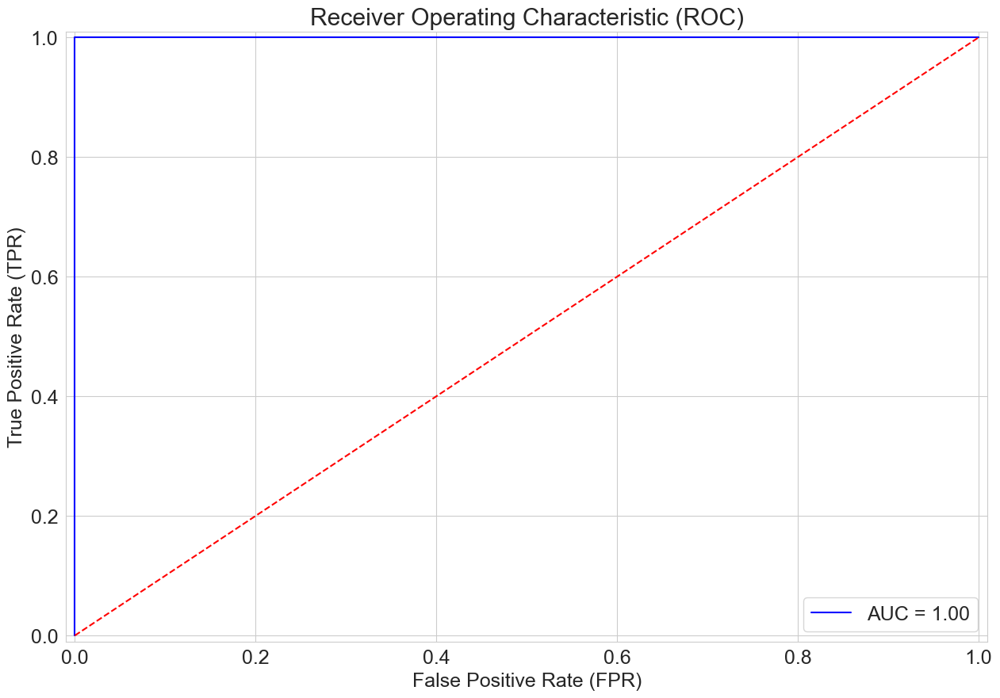

In [24]:
#---find the area under the curve---
roc_auc = auc(fpr, tpr)
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15,10)
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([-0.01, 1.01])
plt.ylim([-0.01, 1.01])
plt.ylabel('True Positive Rate (TPR)')
plt.xlabel('False Positive Rate (FPR)')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc = 'lower right')
plt.show()

In [25]:
import sys
!{sys.executable} -m pip install plotly
import plotly.express as px

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
#fig.show()

### Probability Estimates with go.Contour: <i>import plotly.graph_objects as go</i>
Just like the previous example, we will first train our kNN model on the training set.

Instead of predicting the conference for the test set, we can predict the confidence map for the entire area that wraps around the dimensions of our dataset. To do this, we use np.meshgrid to create a grid, where the distance between each point is denoted by the mesh_size variable.

Then, for each of those points, we will use our model to give a confidence score, and plot it with a contour plot.
In this example, we will use graph objects, Plotly's low-level API for building figures.

In [26]:
# Create a mesh grid on which we will run our model
import plotly.graph_objects as go
mesh_size = .02
margin = 0.25
x_min, x_max = x[:, 0].min() - margin, x[:, 0].max() + margin
y_min, y_max = x[:, 1].min() - margin, x[:, 1].max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)


Z = knn.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
Z = Z.reshape(xx.shape)


# Plot the figure
fig = go.Figure(data=[
    go.Contour(
        x=xrange,
        y=yrange,
        z=Z,
        colorscale='RdBu'
    )
])
fig.show()

### GradientBoostingClassifier

In [27]:
# Logging for Visual Comparison
log_cols=["Classifier", "Accuracy", "Log Loss"]
log = pd.DataFrame(columns=log_cols)

log_entry = pd.DataFrame([[knn.__class__.__name__, result2*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

clf = GradientBoostingClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

result = confusion_matrix(y_test, ypred)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))


log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])


****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 2.190588911482208e-05


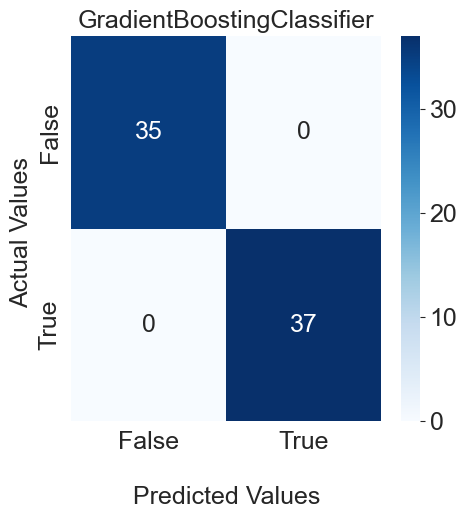

In [28]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()


### RandomForestClassifier

In [29]:
clf = RandomForestClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree
fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 9.992007221626415e-16


[Text(0.5, 0.75, '[-1.00000000e+00 -5.71606281e-12] <= 0.332\ngini = 0.486\nsamples = 185\nvalue = [120, 168]\nclass = 49 below'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 87\nvalue = [120, 0]\nclass = 50 above'),
 Text(0.75, 0.25, 'gini = 0.0\nsamples = 98\nvalue = [0, 168]\nclass = 49 below')]

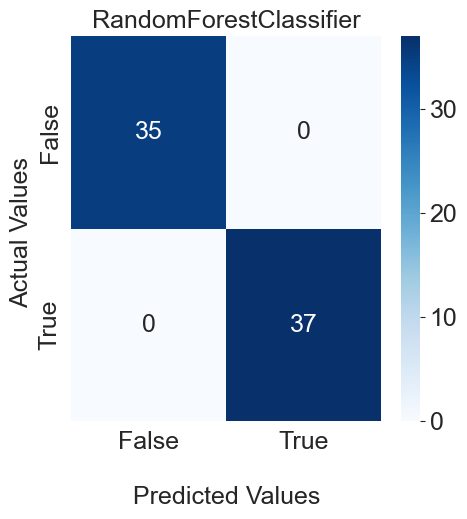

In [30]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### AdaBoostClassifier

In [31]:
clf = AdaBoostClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree
fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 9.992007221626415e-16


[Text(0.5, 0.75, '[-1.00000000e+00 -5.71606281e-12] <= 0.332\ngini = 0.5\nsamples = 288\nvalue = [0.503, 0.497]\nclass = 50 above'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 145\nvalue = [0.503, 0.0]\nclass = 50 above'),
 Text(0.75, 0.25, 'gini = -0.0\nsamples = 143\nvalue = [0.0, 0.497]\nclass = 49 below')]

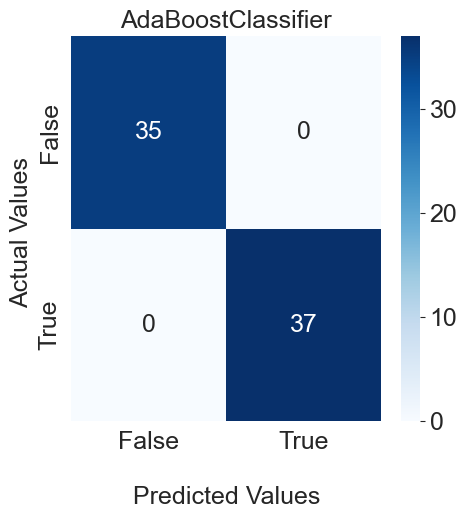

In [32]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### https://askdatascience.com/777/score-vs-accuracyscore-in-sklearn

### DecisionTreeClassifier

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 9.992007221626415e-16


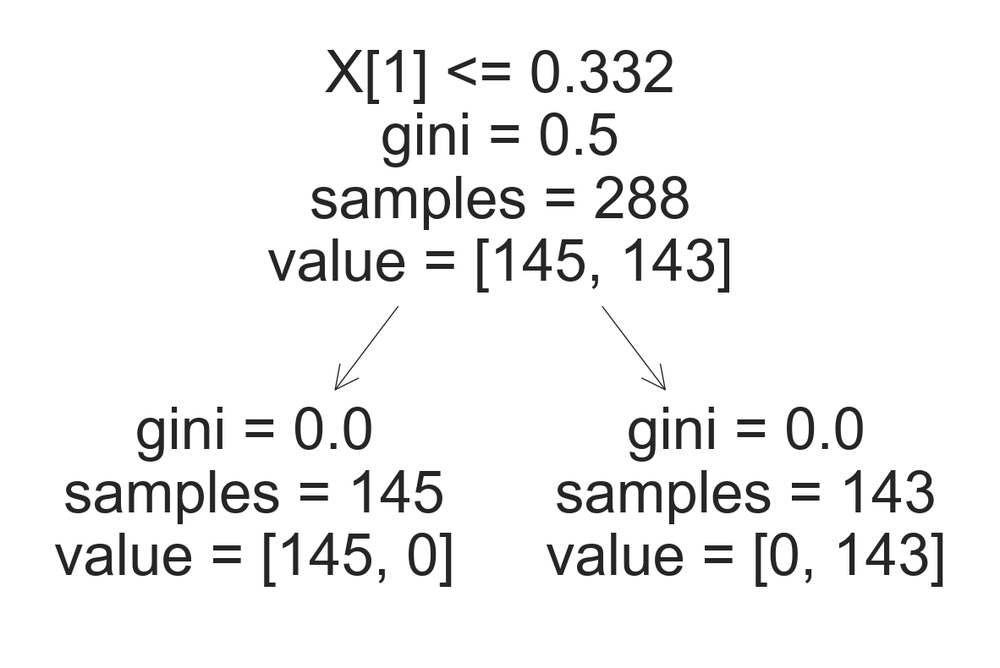

In [33]:

from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn import tree
tree.plot_tree(clf)
plt.show()

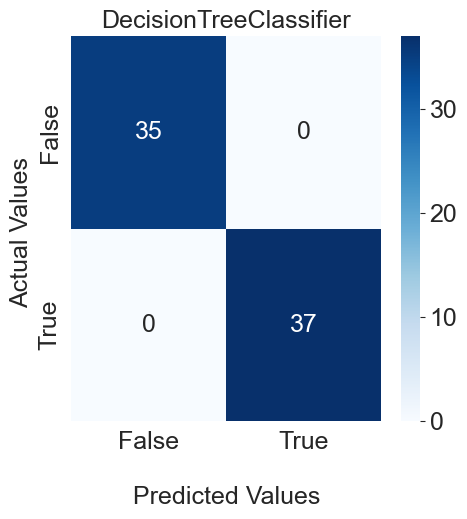

In [34]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### SVC

In [35]:
from sklearn.svm import SVC, LinearSVC, NuSVC
clf = SVC(kernel="rbf", C=0.025, probability=True)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 0.005850737969780588


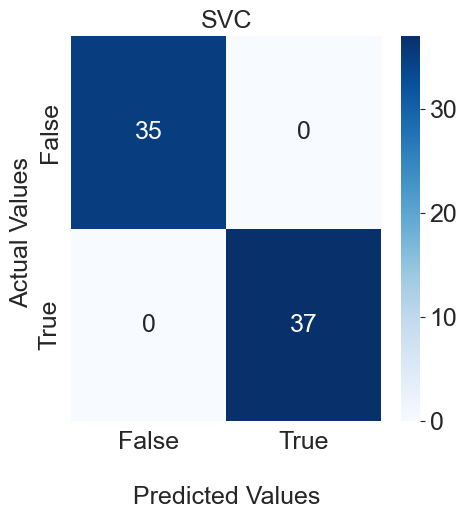

In [36]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### NuSVC

In [37]:
from sklearn.svm import SVC, NuSVC
clf = NuSVC(probability=True)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 0.007896376740525547


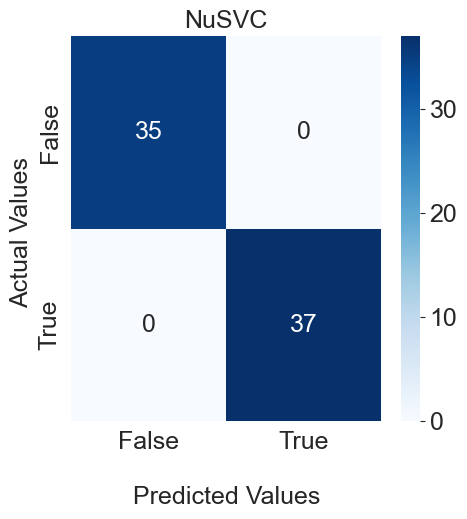

In [38]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### LinearDiscriminantAnalysis

In [39]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
clf = LinearDiscriminantAnalysis()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 0.09720378911313711


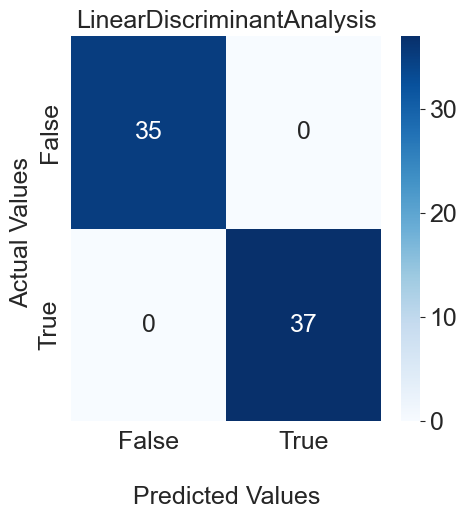

In [40]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### GaussianNB

In [41]:
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 3.550760375838784e-06


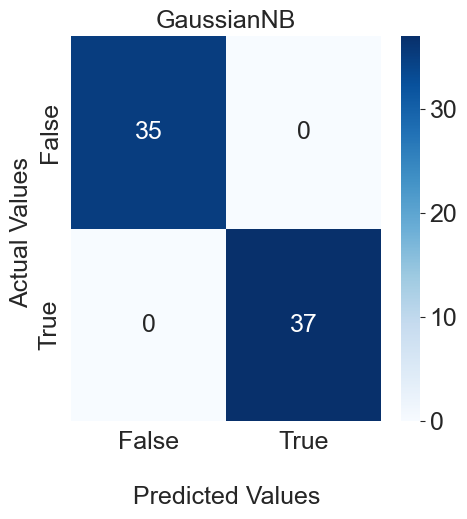

In [42]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### Logistic Regression

In [43]:
from sklearn import linear_model

clf = linear_model.LogisticRegression(max_iter=50)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 0.06398621281462812


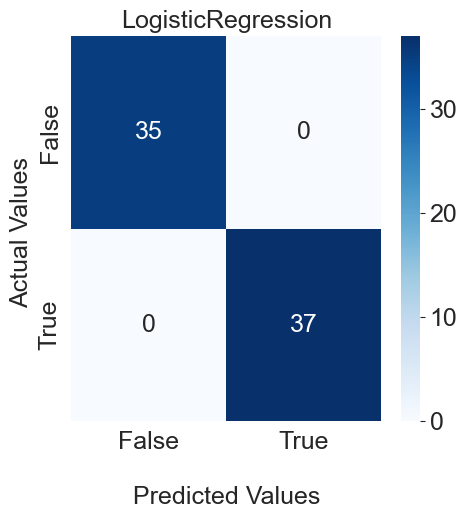

In [44]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### MLPClassifier


In [45]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(max_iter=3000)
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 0.01409708499783343


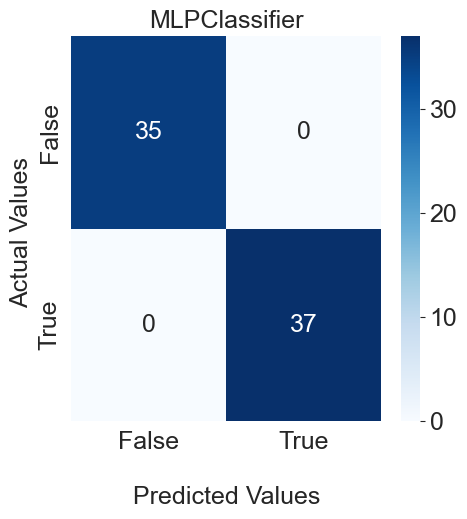

In [46]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### BaggingClassifier

In [47]:
from sklearn.ensemble import BaggingClassifier
clf = BaggingClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

from sklearn.tree import plot_tree

fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 9.992007221626415e-16


[Text(0.5, 0.75, '[-1.00000000e+00 -5.71606281e-12] <= 0.332\ngini = 0.498\nsamples = 183\nvalue = [136, 152]\nclass = 49 below'),
 Text(0.25, 0.25, 'gini = 0.0\nsamples = 87\nvalue = [136, 0]\nclass = 50 above'),
 Text(0.75, 0.25, 'gini = 0.0\nsamples = 96\nvalue = [0, 152]\nclass = 49 below')]

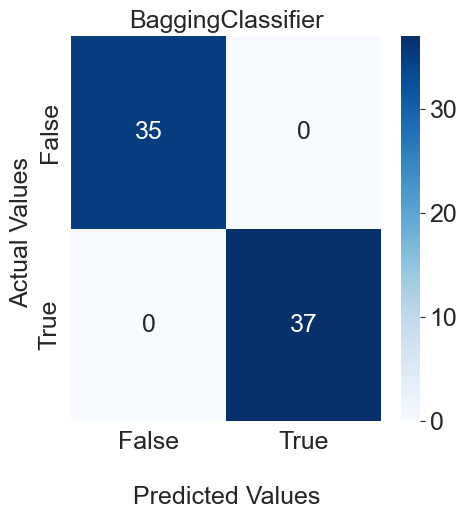

In [48]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### HistGradientBoostingClassifier

In [49]:
from sklearn.ensemble import HistGradientBoostingClassifier
clf = HistGradientBoostingClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 2.1905889523152532e-05


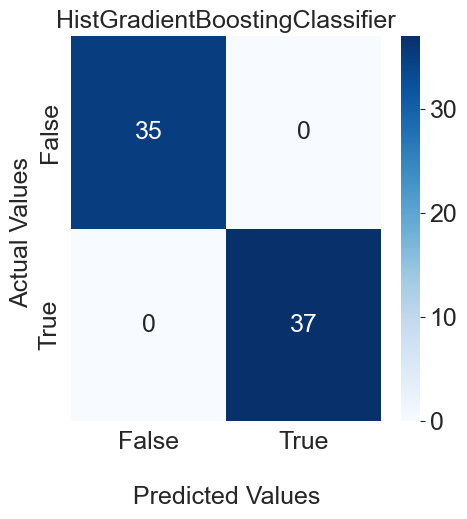

In [50]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### ExtraTreesClassifier

In [51]:
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier()
clf.fit(x_train, y_train)

print('****Results****')

train_predictions = clf.predict(x_test)
#print(y_test, train_predictions)

acc = accuracy_score(y_test, train_predictions)
print("Accuracy: {:.4%}".format(acc))

result = confusion_matrix(y_test, train_predictions)
print(result)
    
train_predictions = clf.predict_proba(x_test)
ll = log_loss(y_test, train_predictions)
print("Log Loss: {}".format(ll))

log_entry = pd.DataFrame([[clf.__class__.__name__, acc*100, ll]], columns=log_cols)
log = pd.concat([log_entry,log])

fig = plt.figure(figsize=(150, 100))
plot_tree(clf.estimators_[0], 
          feature_names=x_train,
          class_names=y_test, 
          filled=True, impurity=True, 
          rounded=True)

****Results****
Accuracy: 100.0000%
[[35  0]
 [ 0 37]]
Log Loss: 0.001775463493193831


[Text(0.4107142857142857, 0.9285714285714286, '[-2.00000000e-01 -5.71248648e-12] <= -0.839\ngini = 0.5\nsamples = 288\nvalue = [145, 143]\nclass = 50 above'),
 Text(0.21428571428571427, 0.7857142857142857, '[-1.00000000e+00 -5.71606281e-12] <= 4.284\ngini = 0.5\nsamples = 26\nvalue = [13, 13]\nclass = 50 above'),
 Text(0.14285714285714285, 0.6428571428571429, '[-1.00000000e+00 -5.71606281e-12] <= 0.573\ngini = 0.497\nsamples = 24\nvalue = [13, 11]\nclass = 50 above'),
 Text(0.07142857142857142, 0.5, 'gini = 0.0\nsamples = 13\nvalue = [13, 0]\nclass = 50 above'),
 Text(0.21428571428571427, 0.5, 'gini = 0.0\nsamples = 11\nvalue = [0, 11]\nclass = 49 below'),
 Text(0.2857142857142857, 0.6428571428571429, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]\nclass = 49 below'),
 Text(0.6071428571428571, 0.7857142857142857, '[-1.00000000e+00 -5.71606281e-12] <= 1.597\ngini = 0.5\nsamples = 262\nvalue = [132, 130]\nclass = 50 above'),
 Text(0.5357142857142857, 0.6428571428571429, '[-2.00000000e-01 -5.71

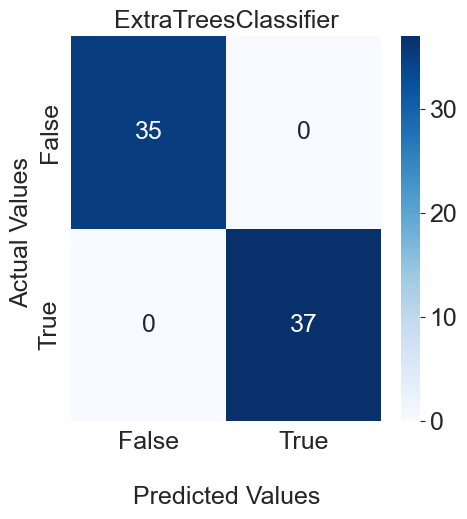

In [52]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 18})

ax = sns.heatmap(result, annot=True, cmap='Blues',ax=ax)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
ax.set_title(clf.__class__.__name__,fontsize=18);
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
ax.xaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### Comparação entre classificadores

In [53]:
log.to_csv('log_Age.csv')
log

,Classifier,Accuracy,Log Loss
0,ExtraTreesClassifier,100.0,1.775463e-03
0,HistGradientBoostingClassifier,100.0,2.190589e-05
0,BaggingClassifier,100.0,9.992007e-16
0,MLPClassifier,100.0,1.409708e-02
0,LogisticRegression,100.0,6.398621e-02
0,GaussianNB,100.0,3.550760e-06
0,LinearDiscriminantAnalysis,100.0,9.720379e-02
0,NuSVC,100.0,7.896377e-03
0,SVC,100.0,5.850738e-03
0,DecisionTreeClassifier,100.0,9.992007e-16


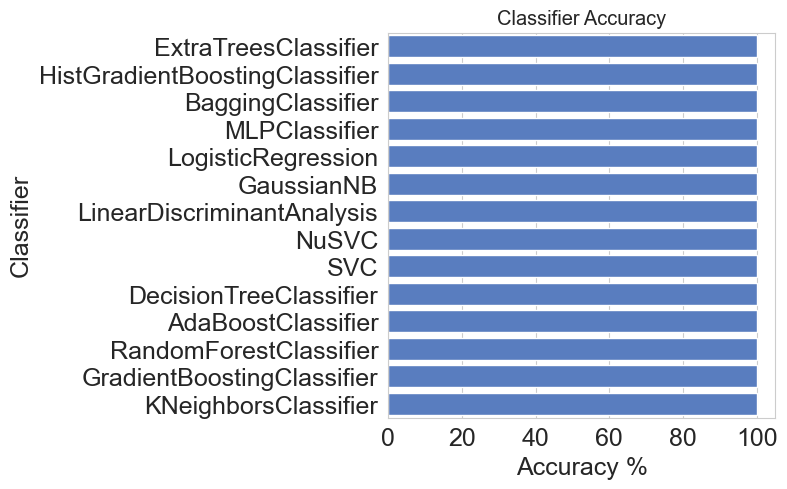

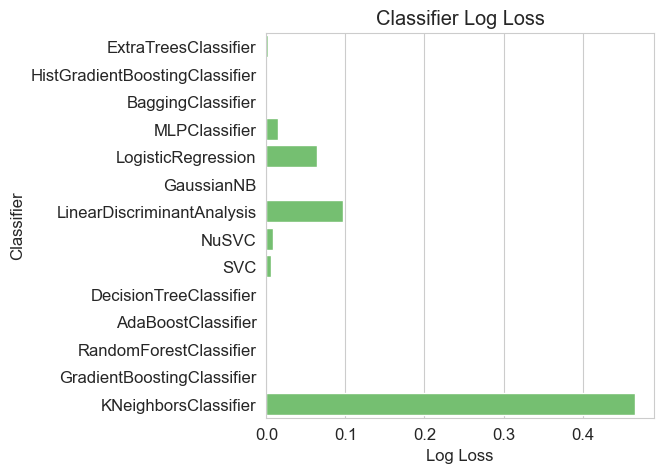

In [54]:
fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 12})

sns.set_color_codes("muted")
ax=sns.barplot(x='Accuracy', y='Classifier', data=log, color="b",ax=ax)

plt.xlabel('Accuracy %')
plt.title('Classifier Accuracy')
plt.show()


fig, ax = plt.subplots(figsize=(5, 5))
plt.rcParams.update({'font.size': 12})

sns.set_color_codes("muted")
ax=sns.barplot(x='Log Loss', y='Classifier', data=log, color="g",ax=ax)

plt.xlabel('Log Loss')
plt.title('Classifier Log Loss')
plt.show()

http://www.xavierdupre.fr/app/sklearn-onnx/helpsphinx/supported.html